# LAB 4
--------------------------------------------------------------------------------
# Name : Vedant R Landge
# PRN : 20190802005
# ADVANCED AI
# AIM : TO STUDY AND PERFORM CLASSIFICATION ON AUDIO/MUSIC STUDY.

## A. Amplitude envelop and loudness -

#### 1. Import libraries.

In [1]:
import librosa
import librosa.display
import IPython
import matplotlib.pyplot as plt
import numpy as np

#### 2. Load audio file with librosa library.

In [2]:
y, sr = librosa.load('Action-Rock.mp3')

/usr/local/lib/python3.7/dist-packages/librosa/core/audio.py:165: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn("PySoundFile failed. Trying audioread instead.")


#### 3. Using IPython.display.Audio, to play the audio.

In [3]:
IPython.display.Audio(data=y, rate=sr)

#### 4. Plot the audio array using librosa.display.waveplot.

Text(0.5, 1.0, 'waveplot of music sample')

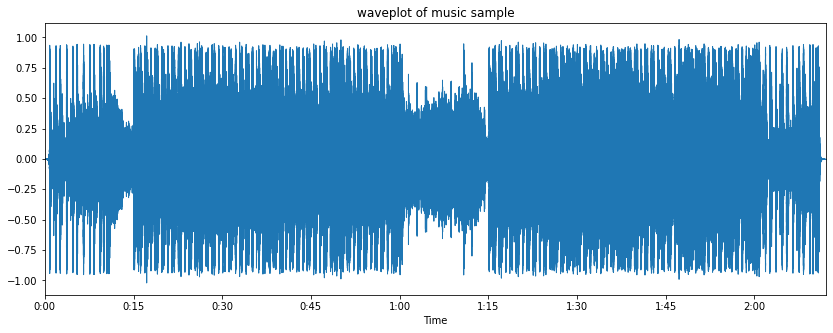

In [4]:
plt.figure(figsize=(14,5))
#plotting the sampled signal
librosa.display.waveplot(y, sr=sr)
plt.title("waveplot of music sample")

#### 5. Visualize audio signal in the time domain.

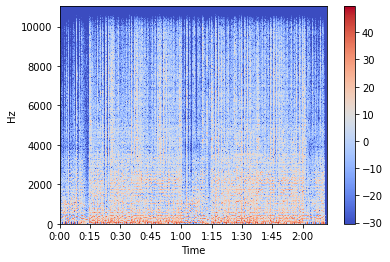

In [5]:
#x: numpy array
X = librosa.stft(y)
#converting into energy levels(dB)
Xdb = librosa.amplitude_to_db(abs(X))

#plt.figure(figsize=(20,5))
librosa.display.specshow(Xdb, sr=sr, x_axis='time', y_axis='hz')
plt.colorbar()

#### 6. Calculate amplitude envelope for each frame.

In [6]:
FRAME_SIZE = 1024
HOP_LENGTH =64

In [7]:
"""calculate the amplitude envelope of a signal with a frame size nad hop length."""
amplitude_envelope = []

# Calculate the amplitude envelope for each frame.
for i in range(0, len(y), HOP_LENGTH):
  amplitude_envelope_current_frame = max(y[i:i+FRAME_SIZE])
  amplitude_envelope.append(amplitude_envelope_current_frame)

#### 7. Number of frames in amplitude envelope.

In [8]:
#number of frames_in amplitude envelope
ae = np.array(amplitude_envelope)

#### 8. Calculate amplitude envelope for audio(all frames)

#### 9. Visualize amplitude envelope.

(-1.0, 1.0)

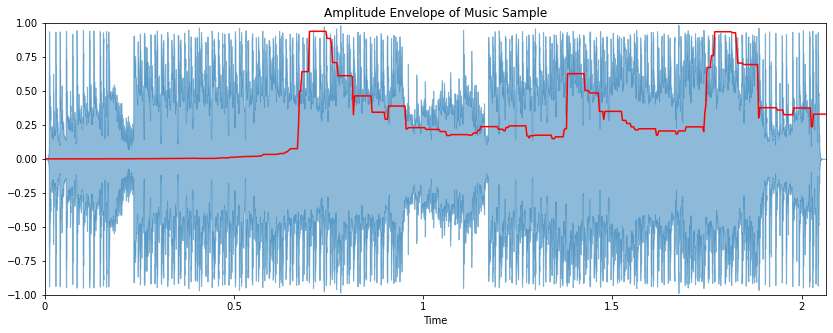

In [9]:
# visualizing Amplitude Envelope
frames = range(0, ae.size)
t = librosa.frames_to_time(frames, hop_length=HOP_LENGTH)
plt.figure(figsize=(14, 5))
librosa.display.waveplot (ae, alpha=0.5)
plt.plot(t, ae, color="r")
plt.title("Amplitude Envelope of Music Sample")
plt.ylim(-1,1)

## B. Spectral centroid

#### 1. Import libraries

In [10]:
%matplotlib inline
import seaborn
import numpy, scipy, matplotlib.pyplot as plt, IPython.display as ipd, sklearn
import librosa, librosa.display
plt.rcParams['figure.figsize'] = (14,5)

#### 2. Load audio file with librosa library.

In [11]:
x, sr = librosa.load('Action-Rock.mp3')
ipd.Audio(x, rate=sr)

/usr/local/lib/python3.7/dist-packages/librosa/core/audio.py:165: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn("PySoundFile failed. Trying audioread instead.")


In [12]:
spectral_centroids = librosa.feature.spectral_centroid(x, sr=sr)[0]
spectral_centroids.shape

(5691,)

#### 5. Compute the time variable for visualization.

In [13]:
frames = range(len(spectral_centroids))
t =  librosa.frames_to_time(frames)

#### 6. Normalize the spectral centroid for visualization

In [14]:
def normalize(x, axis=0):
  return sklearn.preprocessing.minmax_scale(x, axis=axis)

#### 7. Plot the Spectral Centroid along the waveform.

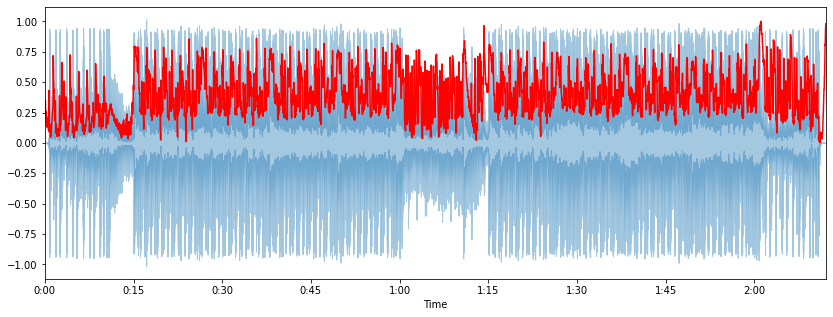

In [15]:
librosa.display.waveplot(x, sr=sr, alpha=0.4)
plt.plot(t, normalize(spectral_centroids), color='r')

## C. MFCC(Mel-Frequency Cepstral Coefficients)

#### 3. Extract MFCCs

In [16]:
mfccs = librosa.feature.mfcc(x, sr=sr)
print(mfccs.shape)

(20, 5691)


#### 4. Visualize MFCCs

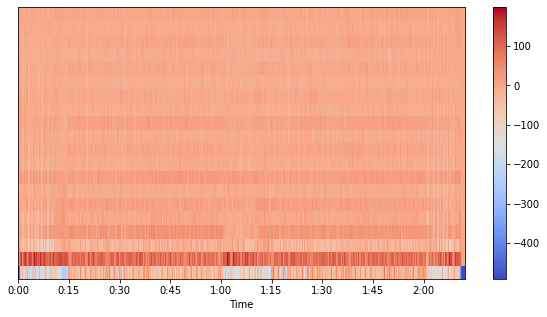

In [17]:
# Displaying the mfccs
plt.figure(figsize=(10, 5))
librosa.display.specshow(mfccs, sr=sr, x_axis='time')
plt.colorbar()

## D. Pitch salience

#### 3. Perform Pitch Scaling using librosa library

In [18]:
y_third = librosa.effects.pitch_shift(y, sr=sr, n_steps=4)

Text(0.5, 1.0, 'Shift up by a major third')

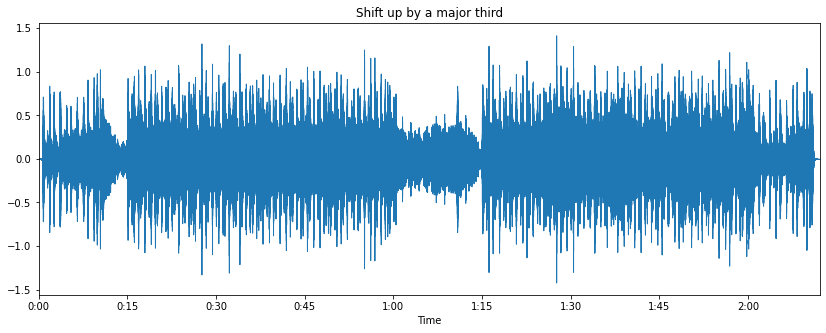

In [19]:
librosa.display.waveplot(y_third, sr=sr)
plt.title("Shift up by a major third")

In [20]:
y_tritone = librosa.effects.pitch_shift(y, sr=sr, n_steps=6)

Text(0.5, 1.0, 'shift down by a tritone')

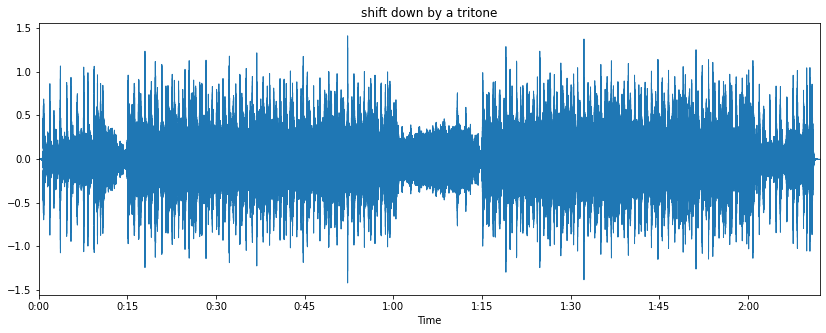

In [21]:
librosa.display.waveplot(y_tritone, sr=sr)
plt.title("shift down by a tritone")

In [22]:
y_three_qt = librosa.effects.pitch_shift(y, sr=sr, n_steps=3, bins_per_octave=24)

Text(0.5, 1.0, 'shift up by 3 quarter-tones')

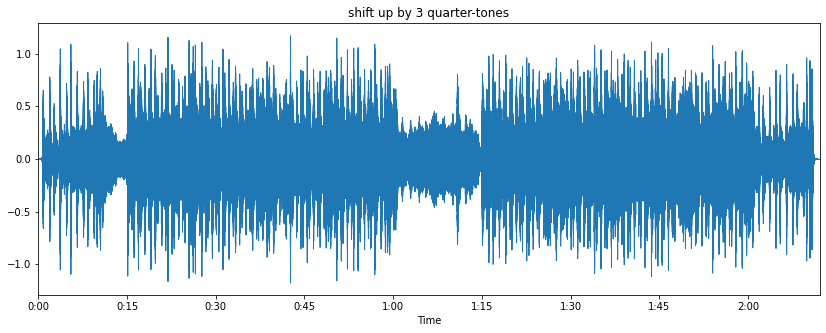

In [23]:
librosa.display.waveplot(y_three_qt, sr=sr)
plt.title("shift up by 3 quarter-tones")

## E. Chroma Features

#### 3. Perform Chroma feature extraction using librosa library

In [24]:
chroma = librosa.feature.chroma_stft(y=y, sr=sr)

#### 4. Display Output graph

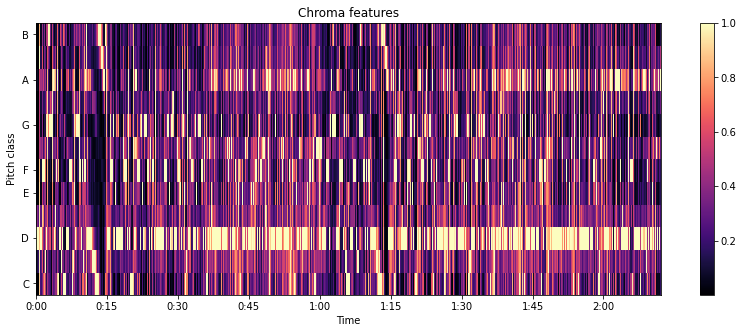

In [25]:
librosa.display.specshow(chroma, sr=sr, y_axis='chroma', x_axis='time')
plt.title("Chroma features")
plt.colorbar()
plt.show()